---
**Arithmetic gev mixture models**
---

# Requirements

## External modules

In [1]:
options(tidyverse.quiet = TRUE)
options(caret.quiet = TRUE)
options(Hmisc.quiet = TRUE)
options(vroom.quiet = TRUE)
options(repr.plot.width=19, repr.plot.height=12)

In [2]:
library(tidyverse)
library(readr)
library(DescTools)
library(Hmisc)
library(stringr)
library(future.apply)


Attaching package: ‘Hmisc’


The following objects are masked from ‘package:DescTools’:

    %nin%, Label, Mean, Quantile


The following objects are masked from ‘package:dplyr’:

    src, summarize


The following objects are masked from ‘package:base’:

    format.pval, units


Loading required package: future



## Internal functions

In [3]:
path <- ".."

xfun::in_dir(dir = path, expr = source("./eva_pipeline/src/read_data.R"))
xfun::in_dir(dir = path, expr = source("./eva_pipeline/src/load_functions.R"))
xfun::in_dir(dir = path, expr = source("./eva_pipeline/src/make_models.R"))
xfun::in_dir(dir = path, expr = source("./eva_pipeline/src/transform_data.R"))
xfun::in_dir(dir = path, expr = source("./eva_pipeline/src/calculate_model_aic.R"))
xfun::in_dir(dir = path, expr = source("./eva_pipeline/src/save_multiple_model_aic.R"))
xfun::in_dir(dir = path, expr = source("./eva_pipeline/src/extract_multiple_model_aic.R"))


Attaching package: ‘vroom’


The following objects are masked from ‘package:readr’:

    as.col_spec, col_character, col_date, col_datetime, col_double,
    col_factor, col_guess, col_integer, col_logical, col_number,
    col_skip, col_time, cols, cols_condense, cols_only, date_names,
    date_names_lang, date_names_langs, default_locale, fwf_cols,
    fwf_empty, fwf_positions, fwf_widths, locale, output_column,
    problems, spec


Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:future’:

    cluster


The following objects are masked from ‘package:DescTools’:

    MAE, RMSE


The following object is masked from ‘package:purrr’:

    lift



Attaching package: ‘actuar’


The following objects are masked from ‘package:stats’:

    sd, var


The following object is masked from ‘package:grDevices’:

    cm




## Data import

In [4]:
experimentation_01_merged_data <- xfun::in_dir(dir = path, expr = read_data("./04_experimentation_01/merged_data.csv"))

experimentation_02_merged_data <- xfun::in_dir(dir = path, expr = read_data("./04_experimentation_02/merged_data.csv"))

experimentation_03_merged_data <- xfun::in_dir(dir = path, expr = read_data("./04_experimentation_03/merged_data.csv", nrow_skip = 14394))

experimentation_04_merged_data <- xfun::in_dir(dir = path, expr = read_data("./04_experimentation_04/merged_data.csv"))

# Data analysis

## Transform data

In [5]:
experimentations <- c("experimentation_01", "experimentation_02", "experimentation_03", "experimentation_04")

response_vars <- c("lateral_error", "longitudinal_error")

In [6]:
experimentation <- experimentations[1]

response_var <- response_vars[1]

In [7]:
# extract the selected data
if (experimentation == "experimentation_01"){
    data <- experimentation_01_merged_data
} else if (experimentation == "experimentation_02"){
    data <- experimentation_02_merged_data
} else if (experimentation == "experimentation_03"){
    data <- experimentation_03_merged_data
} else if (experimentation == "experimentation_04"){
    data <- experimentation_04_merged_data
} else {
    stop("Sorry, incorrect entry for the argument 'experimentation'")
}

In [10]:
# DT::datatable(data)

In [8]:
response_abs <- TRUE
coefficient_iqr <- 3
iterate <- 20
remove_outliers <- FALSE
scale_predictors <- TRUE
method <- c("interpolate", "mode", "median", "mean")[1]

In [9]:
data_processed_object <- transform_data(
  data = data, 
  response_var = response_var,
  response_abs = response_abs,
  scale_predictors = scale_predictors,
  coefficient_iqr = coefficient_iqr, 
  iterate = iterate,
  remove_outliers = remove_outliers,
  method = method)

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 



In [99]:
names(data_processed_object)

[1] "response"            "predictors"          "unscaled_predictors"
[4] "outlier_positions"   "outlier_values"      "outlier_substitutes"
[7] "iterate"

In [100]:
iterate <- data_processed_object$iterate

iterate

[1] 3

## Response variable

In [21]:
# response variable
#x <- data_processed_object$response

x <- abs(data[, response_var])

describe(x)

x 
       n  missing distinct     Info     Mean      Gmd      .05      .10 
   22846        0    22580        1   0.5857   0.6824  0.04819  0.08723 
     .25      .50      .75      .90      .95 
 0.14571  0.32552  0.63158  0.94870  1.31011 

lowest : 8.5354e-05  8.76884e-05 0.000136104 0.000184512 0.00026877 
highest: 21.7967     21.895      22.055      22.0902     22.2734    

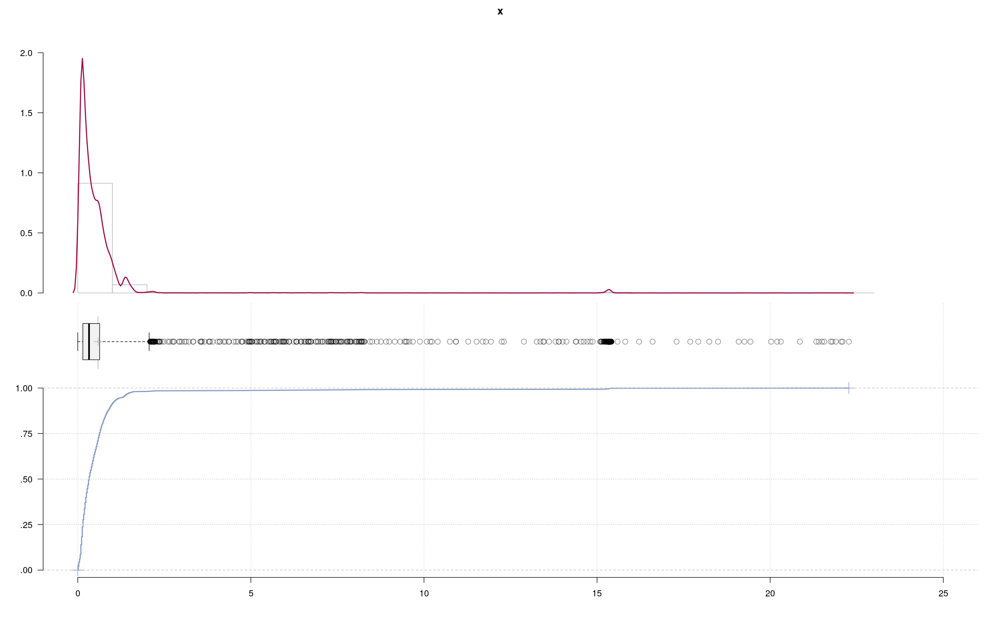

In [22]:
PlotFdist(x = x, args.boxplot = list(range = coefficient_iqr))

In [23]:
modes_object <- calculate_modes(x = x)

names(modes_object)

[1] "density_values"          "density_support"        
[3] "density_maxima"          "density_maxima_argument"
[5] "density_minima"          "density_minima_argument"

In [24]:
extrema <- data.frame("modes" = modes_object$density_maxima_argument, "maxima" = modes_object$density_maxima)
rownames(extrema) <- 1:nrow(extrema)
extrema

,modes,maxima
,<dbl>,<dbl>
1,0.1217127649,2.0214056902863
2,0.5674869781,0.7744256444764
3,1.3709812389,0.1401725805562
4,2.1634687290,0.0130098930565
5,2.3340736748,0.0024381006208
6,2.6367598689,0.0007115517189
7,2.7523309612,0.0011180891727
8,2.9449494484,0.0008917815952
9,3.0990442381,0.0007521706276


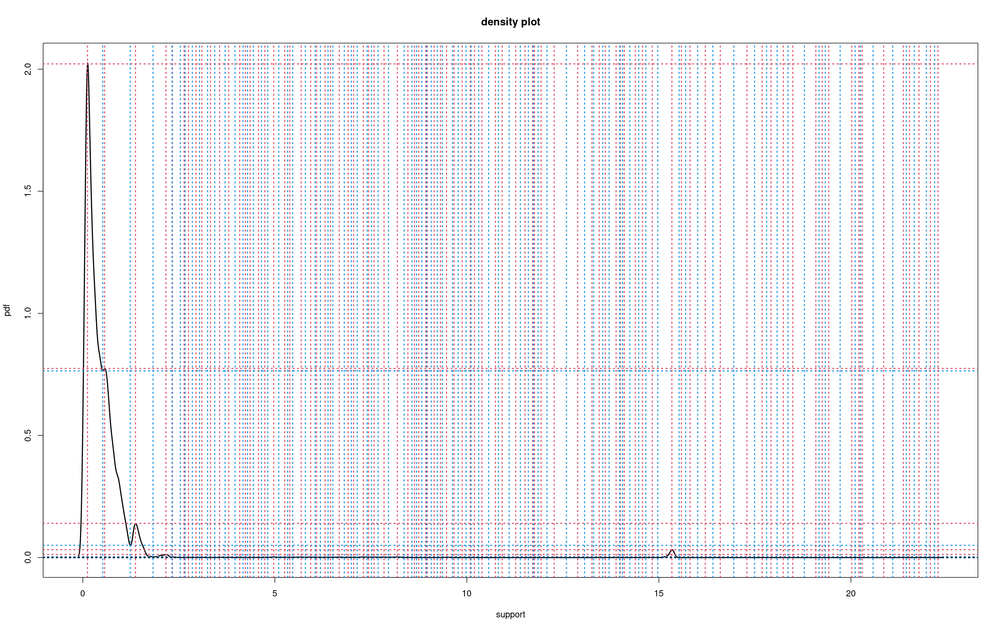

In [25]:
plot_modes(modes_object)

In [26]:
outlier_values <- data_processed_object$outlier_values

describe(outlier_values)

outlier_values 
       n  missing distinct     Info     Mean      Gmd      .05      .10 
     415        0      415        1    9.562    6.367    2.121    2.185 
     .25      .50      .75      .90      .95 
   4.892    8.026   15.319   15.375   17.414 

lowest : 2.02129 2.02751 2.03073 2.03464 2.038  
highest: 21.7967 21.895  22.055  22.0902 22.2734

In [27]:
outlier_substitutes <- data_processed_object$outlier_substitutes

outlier_values_df <- data.frame("outlier_values" = outlier_values, "outlier_substitutes" = outlier_substitutes)

DT::datatable(outlier_values_df)

HTML widgets cannot be represented in plain text (need html)

In [28]:
outlier_positions <- data_processed_object$outlier_positions

outlier_positions

[1]  2342  2343  2344  2345  2346  2347  2348  2349  2350  2351  2352  2353
 [13]  2354  2355  2356  2357  2358  2359  2360  2361  2362  2363  2364  2365
 [25]  2366  2367  2368  2369  2370  2371  2372  2373  2374  2375  2376  2377
 [37]  2378  2379  2380  2381  2382  2383  2384  2385  2386  2387  2388  2389
 [49]  2390  2391  2392  2393  2394  2395  2396  2397  2398  2399  2400  2401
 [61]  2402  2403  2404  2405  2406  2407  2408  2409  2410  2411  2412  2413
 [73]  2414  2415  2416  2417  4810  4811  4812  4813  4814  4815  4816  4817
 [85]  4818  4819  4820  4821  4822  4823  4824  4825  4826  4827  4828  4829
 [97]  4830  4831  4832  4833 13506 16571 16572 16573 16574 16575 16576 16577
[109] 16578 16579 16598 16599 16600 16601 16602 16603 16604 16605 16606 16607
[121] 16608 16609 16610 16611 16612 16613 16614 16615 16616 16617 16618 16619
[133] 16620 16621 16622 16623 16624 16625 16626 16627 16628 16629 16630 16631
[145] 16632 16633 16634 16635 16636 16637 16638 16639 16640 16641 16642 16643
[157] 16644 16645 16646 16647 16648 16649 16650 16651 16652 16653 16654 17446
[169] 17447 18387 18388 18389 18390 18391 18392 18393 18394 18395 18396 18397
[181] 18398 18399 18400 18401 18402 18403 18404 18405 18406 18407 18408 18409
[193] 18410 18411 18412 18413 18415 18416 18417 18418 18419 18420 18421 18422
[205] 18423 18424 18425 18426 18427 18428 18429 18430 18431 18432 18433 18434
[217] 18435 18436 18437 18438 18439 18440 18441 18442 18443 18444 18445 18446
[229] 18447 18448 18449 18450 18451 18452 18453 18454 18455 18456 18457 18458
[241] 18459 18460 18461 18462 18463 18464 18465 18466 18467 18468 18469 18470
[253] 18471 18472 18473 18474 18475 18476 18477 18478 18479 18480 18481 18482
[265] 18483 18484 18485 18486 18487 18488 18489 18490 18491 18492 18493 18494
[277] 18495 18496 18497 18498 18499 18500 18501 18502 18503 18504 18505 18506
[289] 18507 18508 18509 18510 18511 18512 18513 18514 18515 18516 18517 18518
[301] 18519 18520 18521 18522 18523 18524 18525 18526 18527 18528 18529 18530
[313] 18531 18532 18533 18534 18535 18536 18537 18538 18539 18540 18541 18542
[325] 18543 18544 18545 18546 18547 18548 18549 18550 18551 18552 18553 18554
[337] 18555 18556 18557 18558 18559 18560 18561 18562 18563 18564 18565 18566
[349] 18567 18568 18569 18570 18571 18572 18573 18574 18575 18576 18577 18578
[361] 18579 18580 18581 18582 18583 18584 18585 18586 18587 18588 18589 18590
[373] 18591 18592 18593 18594 18595 18596 18597 18598 18599 18600 18601 18602
[385] 18603 18604 18605 18606 18607 18608 18609 18610 18611 18612 18613 18614
[397] 18615 18616 18617 18618 18619 18624 16580 18620 18621 18622 18623 18625
[409] 18627 18628 18629 18630 18631 19840  2418

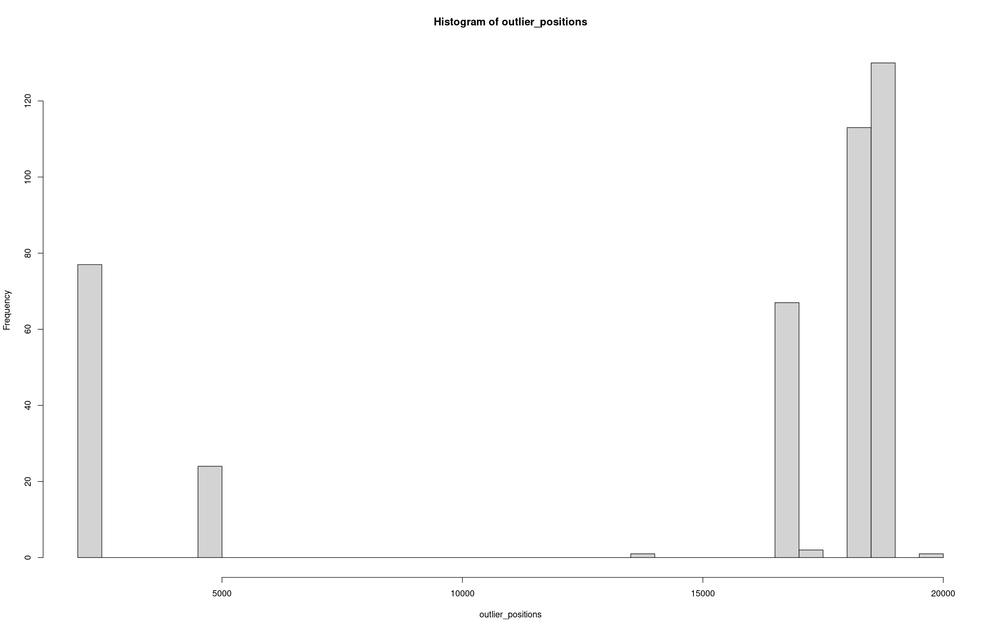

In [29]:
hist(outlier_positions, nclass = 50)

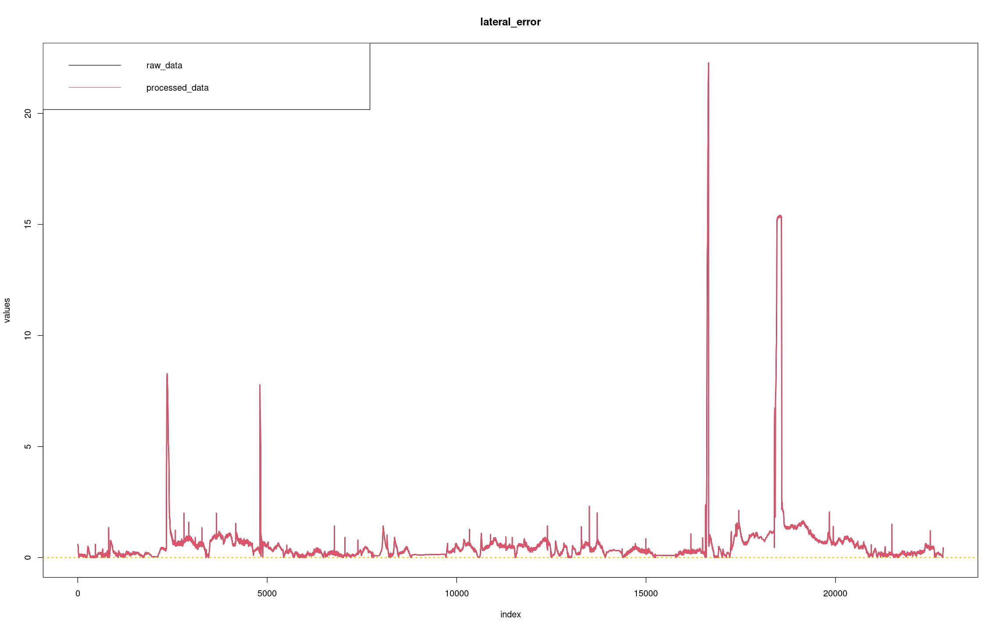

In [30]:
plot(abs(data[, response_var]), 
     type = "l", 
     lwd = 2, 
     ylab = "values", 
     xlab = "index",
    main = paste(response_var))

abline(h = 0, lty = "dotted", col = 7, lwd = 2)

lines(x, col = 2, lwd = 2)

legend("topleft", legend = c("raw_data", "processed_data"), col = c(1, 2), lty = 1:1, cex = 1)

## Predictor variables

In [31]:
# scaled predictor variables
data_covariates <- data_processed_object$predictors

In [32]:
# DT::datatable(data_covariates)

In [33]:
dim(na.omit(data_covariates))

[1] 22846   213

In [34]:
# unscaled predictor variables
unscaled_data_covariates <- data_processed_object$unscaled_predictors

In [35]:
# DT::datatable(unscaled_data_covariates)

In [36]:
data_covariates_detection <- unscaled_data_covariates %>% select(starts_with("object_"))

detection_classes_counts <- apply(data_covariates_detection, 2, sum, na.rm = TRUE)

names(detection_classes_counts) <- names(data_covariates_detection)

detection_classes_counts_df <- data.frame("total" = sort(detection_classes_counts, decreasing = TRUE))
detection_classes_counts_df$rank <- 1:nrow(detection_classes_counts_df)

In [37]:
detection_classes_counts_df

,total,rank
,<int>,<int>
object_total_car,77838,1
object_total_street_light,67126,2
object_total_tree_group,66200,3
object_total_tree,63877,4
object_total_tenement,63072,5
object_total_traffic_sign,61376,6
object_total_fence,54267,7
object_total_electric_pole,48264,8
object_total_traffic_light,44407,9


In [38]:
classes <- rownames(detection_classes_counts_df)
classes <- unlist(str_split(string = classes, pattern = "object_total_", n = Inf, simplify = FALSE))
classes <- unlist(strsplit(x = classes, split = ".", fixed = TRUE))

In [39]:
classes

[1] "car"              "street_light"     "tree_group"       "tree"            
 [5] "tenement"         "traffic_sign"     "fence"            "electric_pole"   
 [9] "traffic_light"    "person"           "truck"            "car_group"       
[13] "house"            "house_group"      "bus"              "special_building"
[17] "bicycle"          "airplane"         "bench"            "stop_sign"       
[21] "train"            "fire_hydrant"     "motorcycle"       "person_group"    
[25] "bird"             "bench_group"      "gas_station"      "boat"            
[29] "helicopter"       "dog"              "scooter"          "parking_meter"   
[33] "tunnel"           "tunnel_entrance"  "bird_group"

In [40]:
nlargest_classes <- 16
nlargest_classes_positions <- order(detection_classes_counts, decreasing = TRUE)[1:nlargest_classes]
selected_detection_classes_counts <- detection_classes_counts[nlargest_classes_positions]

In [41]:
selected_detection_classes_counts

object_total_car     object_total_street_light 
                        77838                         67126 
      object_total_tree_group             object_total_tree 
                        66200                         63877 
        object_total_tenement     object_total_traffic_sign 
                        63072                         61376 
           object_total_fence    object_total_electric_pole 
                        54267                         48264 
   object_total_traffic_light           object_total_person 
                        44407                         43494 
           object_total_truck        object_total_car_group 
                        38963                         30034 
           object_total_house      object_total_house_group 
                        21622                         20366 
             object_total_bus object_total_special_building 
                        18203                         16601

In [42]:
selected_detection_classes <- names(selected_detection_classes_counts)
selected_detection_classes <- unlist(str_split(string = selected_detection_classes, pattern = "object_total_", n = Inf, simplify = FALSE))
selected_detection_classes <- unlist(strsplit(x = selected_detection_classes, split = ".", fixed = TRUE))

In [43]:
selected_detection_classes

[1] "car"              "street_light"     "tree_group"       "tree"            
 [5] "tenement"         "traffic_sign"     "fence"            "electric_pole"   
 [9] "traffic_light"    "person"           "truck"            "car_group"       
[13] "house"            "house_group"      "bus"              "special_building"

In [44]:
unselected_detection_classes <- classes[!is.element(el = classes, set = selected_detection_classes)]

In [45]:
unselected_detection_classes

[1] "bicycle"         "airplane"        "bench"           "stop_sign"      
 [5] "train"           "fire_hydrant"    "motorcycle"      "person_group"   
 [9] "bird"            "bench_group"     "gas_station"     "boat"           
[13] "helicopter"      "dog"             "scooter"         "parking_meter"  
[17] "tunnel"          "tunnel_entrance" "bird_group"

In [46]:
selected_data_covariates <- data_covariates %>% select(!ends_with(unselected_detection_classes))
#selected_data_covariates <- selected_data_covariates %>% select(!contains("_sd_"))

In [47]:
# DT::datatable(selected_data_covariates)

In [48]:
dim(selected_data_covariates)

[1] 22846    99

# Stationary model

## Model estimation

In [134]:
defaultW <- getOption("warn") 
options(warn = -1) 


evd_mixture_model_object <- fit_stationary_evd_mixture_model(
  x = x,
  nclusters = 5,
  minimum_cluster_size = 20,
  iteration_max = 1500,
  do.ci = FALSE,
  confidence_level = 0.95)


options(warn = defaultW)

In [121]:
names(evd_mixture_model_object)

[1] "clusters"                            "x"                                  
 [3] "cluster_data_list"                   "cluster_models"                     
 [5] "iteration"                           "cluster_models_parameters_variation"
 [7] "cluster_attractors_frequencies"      "cluster_attractors_weights"         
 [9] "cluster_attractors_centers"          "cluster_models_coefficients"        
[11] "loglik"                              "cluster_information_criteria"

In [122]:
evd_mixture_model_object$iteration

[1] 1500

In [123]:
evd_mixture_model_object$cluster_models_parameters_variation

location,scale,shape
0.000000000000,0.00000000000,0.00000000000
0.000000000000,0.00000000000,0.00000000000
1.522986771402,-44.07844103487,-27.57036558608
-0.006059223715,-0.02208303339,-0.03561466761
0.000000000000,0.00000000000,0.00000000000


In [124]:
evd_mixture_model_object$cluster_attractors_centers

[1]  0.6680760838  1.5274426236 15.7687042225  6.7408631575  0.1739861135

In [125]:
evd_mixture_model_object$cluster_attractors_frequencies

[1]  9243   833   169   164 12437

In [126]:
cluster_attractors_weights <- evd_mixture_model_object$cluster_attractors_weights

data.frame("weights" = cluster_attractors_weights)

weights
<dbl>
0.404578482010
0.036461524993
0.007397356211
0.007178499519
0.544384137267


In [127]:
cluster_models_coefficients <- data.frame(evd_mixture_model_object$cluster_models_coefficients)

cluster_models_coefficients

location,scale,shape
<dbl>,<dbl>,<dbl>
0.5641450470,0.15872346011,0.06548255932
1.3889826507,0.08572554049,0.59876893477
13.3543359348,45.67447262071,27.52552738653
6.0259083583,1.63295654186,-0.16741797235
0.1365247229,0.08778491720,-0.19193968043


In [128]:
evd_mixture_model_object$cluster_information_criteria

AIC         BIC 
12352.13476 12504.82885

## Model Diagnostic

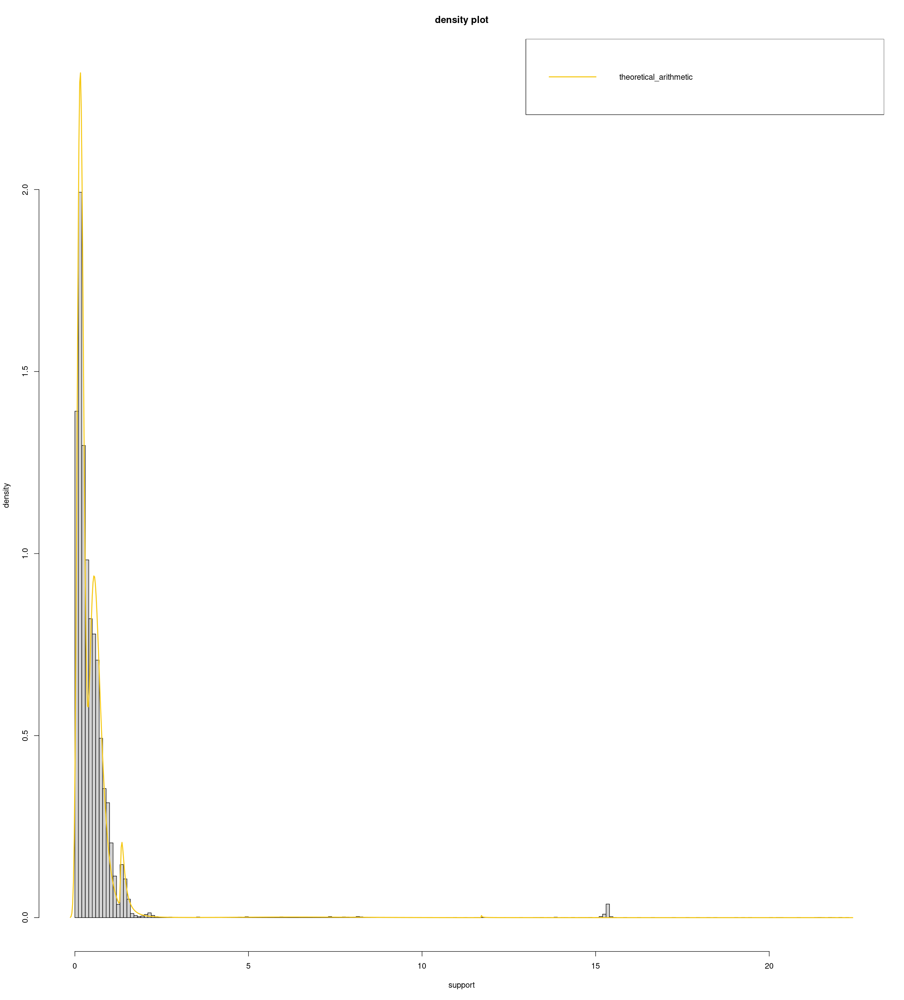

In [129]:
plot_fit_stationary_evd_mixture_model(
  evd_mixture_model_object = evd_mixture_model_object,
  nclass = 200,
  display_all = FALSE,
  xlab = "support",
  ylab = "density",
  main = "density plot",
  legend_position = "topright")

## Model quantile

In [130]:
n <- length(x)

n

[1] 22846

In [131]:
alpha <- n^(-1)

alpha

[1] 4.377133853e-05

In [132]:
quantile <- calculate_gev_mixture_model_inverse_cdf(p = 1 - alpha,
                                                    locations = cluster_models_coefficients$location,
                                                    scales = cluster_models_coefficients$scale,
                                                    shapes = cluster_models_coefficients$shape,
                                                    weights = cluster_attractors_weights,
                                                    kind = c("geometric", "arithmetic", "harmonic")[2],
                                                    iterations = 20)

In [133]:
quantile

[1] 3.763267871e+113

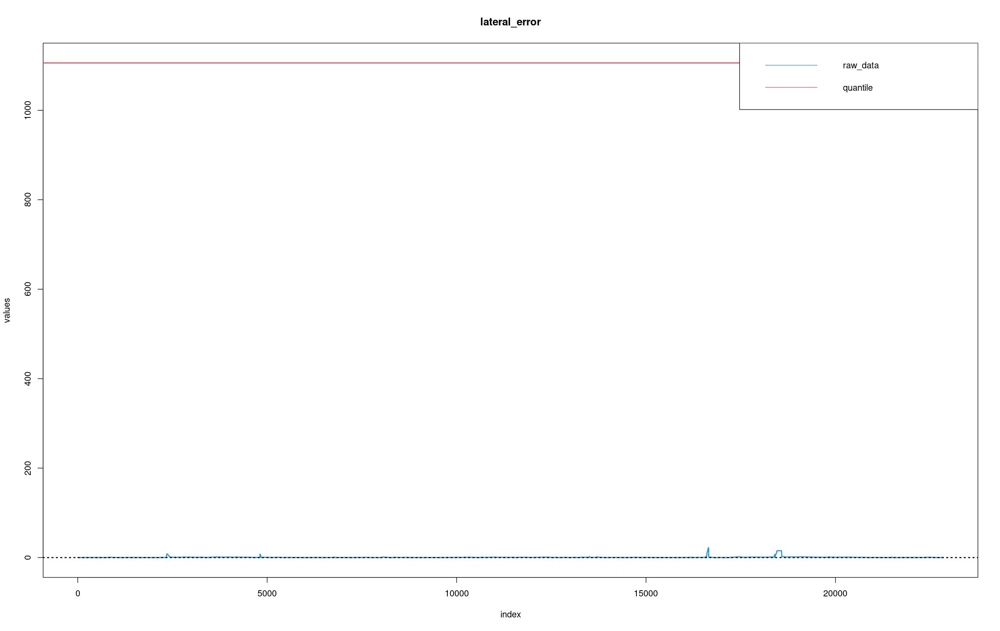

In [88]:
plot(x, 
     type = "l", 
     lwd = 2, 
     col = 4,
     ylim = c(0, max(x, quantile)),
     ylab = "values", 
     xlab = "index",
    main = paste(response_var))

abline(h = 0, lty = "dotted", col = 1, lwd = 2)
abline(h = quantile, lty = 1, col = 2, lwd = 2)

legend("topright", legend = c("raw_data", "quantile"), col = c(4, 2), lty = 1:1, cex = 1)

# Non stationary model

## Model predictors

## Model formula

In [52]:
selected_vars <- names(selected_data_covariates)
selected_vars

[1] "velocity"                      "object"                       
 [3] "area"                          "object_total_street_light"    
 [5] "object_total_fence"            "object_total_tree"            
 [7] "object_total_tree_group"       "object_total_electric_pole"   
 [9] "object_total_traffic_light"    "object_total_special_building"
[11] "area_total_street_light"       "area_total_fence"             
[13] "area_total_tree"               "area_total_tree_group"        
[15] "area_total_electric_pole"      "area_total_traffic_light"     
[17] "area_total_special_building"   "xcenter_mean_street_light"    
[19] "xcenter_mean_fence"            "xcenter_mean_tree"            
[21] "xcenter_mean_tree_group"       "xcenter_mean_electric_pole"   
[23] "xcenter_mean_traffic_light"    "xcenter_mean_special_building"
[25] "xcenter_sd_street_light"       "xcenter_sd_fence"             
[27] "xcenter_sd_tree"               "xcenter_sd_tree_group"        
[29] "xcenter_sd_electric_pole"      "xcenter_sd_traffic_light"     
[31] "xcenter_sd_special_building"   "ycenter_mean_street_light"    
[33] "ycenter_mean_fence"            "ycenter_mean_tree"            
[35] "ycenter_mean_tree_group"       "ycenter_mean_electric_pole"   
[37] "ycenter_mean_traffic_light"    "ycenter_mean_special_building"
[39] "ycenter_sd_street_light"       "ycenter_sd_fence"             
[41] "ycenter_sd_tree"               "ycenter_sd_tree_group"        
[43] "ycenter_sd_electric_pole"      "ycenter_sd_traffic_light"     
[45] "ycenter_sd_special_building"   "object_total_truck"           
[47] "object_total_car"              "object_total_person"          
[49] "object_total_tenement"         "object_total_traffic_sign"    
[51] "object_total_house_group"      "object_total_bus"             
[53] "object_total_house"            "object_total_car_group"       
[55] "area_total_truck"              "area_total_car"               
[57] "area_total_person"             "area_total_tenement"          
[59] "area_total_traffic_sign"       "area_total_house_group"       
[61] "area_total_bus"                "area_total_house"             
[63] "area_total_car_group"          "xcenter_mean_truck"           
[65] "xcenter_mean_car"              "xcenter_mean_person"          
[67] "xcenter_mean_tenement"         "xcenter_mean_traffic_sign"    
[69] "xcenter_mean_house_group"      "xcenter_mean_bus"             
[71] "xcenter_mean_house"            "xcenter_mean_car_group"       
[73] "xcenter_sd_truck"              "xcenter_sd_car"               
[75] "xcenter_sd_person"             "xcenter_sd_tenement"          
[77] "xcenter_sd_traffic_sign"       "xcenter_sd_house_group"       
[79] "xcenter_sd_bus"                "xcenter_sd_house"             
[81] "xcenter_sd_car_group"          "ycenter_mean_truck"           
[83] "ycenter_mean_car"              "ycenter_mean_person"          
[85] "ycenter_mean_tenement"         "ycenter_mean_traffic_sign"    
[87] "ycenter_mean_house_group"      "ycenter_mean_bus"             
[89] "ycenter_mean_house"            "ycenter_mean_car_group"       
[91] "ycenter_sd_truck"              "ycenter_sd_car"               
[93] "ycenter_sd_person"             "ycenter_sd_tenement"          
[95] "ycenter_sd_traffic_sign"       "ycenter_sd_house_group"       
[97] "ycenter_sd_bus"                "ycenter_sd_house"             
[99] "ycenter_sd_car_group"

In [53]:
selected_vars_formula <- as.formula(paste(" ~ ", paste(selected_vars, collapse = " + "), sep = ""))

selected_vars_formula

~velocity + object + area + object_total_street_light + object_total_fence + 
    object_total_tree + object_total_tree_group + object_total_electric_pole + 
    object_total_traffic_light + object_total_special_building + 
    area_total_street_light + area_total_fence + area_total_tree + 
    area_total_tree_group + area_total_electric_pole + area_total_traffic_light + 
    area_total_special_building + xcenter_mean_street_light + 
    xcenter_mean_fence + xcenter_mean_tree + xcenter_mean_tree_group + 
    xcenter_mean_electric_pole + xcenter_mean_traffic_light + 
    xcenter_mean_special_building + xcenter_sd_street_light + 
    xcenter_sd_fence + xcenter_sd_tree + xcenter_sd_tree_group + 
    xcenter_sd_electric_pole + xcenter_sd_traffic_light + xcenter_sd_special_building + 
    ycenter_mean_street_light + ycenter_mean_fence + ycenter_mean_tree + 
    ycenter_mean_tree_group + ycenter_mean_electric_pole + ycenter_mean_traffic_light + 
    ycenter_mean_special_building + ycenter_sd

In [54]:
model_formula <- list("location.fun" = selected_vars_formula, 
                      "scale.fun" = ~ 1, 
                      "shape.fun" = ~ 1)

model_formula

$location.fun
~velocity + object + area + object_total_street_light + object_total_fence + 
    object_total_tree + object_total_tree_group + object_total_electric_pole + 
    object_total_traffic_light + object_total_special_building + 
    area_total_street_light + area_total_fence + area_total_tree + 
    area_total_tree_group + area_total_electric_pole + area_total_traffic_light + 
    area_total_special_building + xcenter_mean_street_light + 
    xcenter_mean_fence + xcenter_mean_tree + xcenter_mean_tree_group + 
    xcenter_mean_electric_pole + xcenter_mean_traffic_light + 
    xcenter_mean_special_building + xcenter_sd_street_light + 
    xcenter_sd_fence + xcenter_sd_tree + xcenter_sd_tree_group + 
    xcenter_sd_electric_pole + xcenter_sd_traffic_light + xcenter_sd_special_building + 
    ycenter_mean_street_light + ycenter_mean_fence + ycenter_mean_tree + 
    ycenter_mean_tree_group + ycenter_mean_electric_pole + ycenter_mean_traffic_light + 
    ycenter_mean_special_buildin

## Model estimation

In [55]:
length(x)

[1] 22846

In [148]:
defaultW <- getOption("warn") 
options(warn = -1) 


ns_evd_mixture_model_object <- fit_non_stationary_evd_mixture_model(
  x = x,
  covariates = selected_data_covariates,
  location.fun = model_formula$location.fun,
  scale.fun = model_formula$scale.fun, 
  shape.fun = model_formula$shape.fun, 
  nclusters = 5,
  minimum_cluster_size = 20,
  iteration_max = 1500,
  do.ci = FALSE,
  confidence_level = 0.95)


options(warn = defaultW)

In [149]:
names(ns_evd_mixture_model_object)

[1] "clusters"                            "x"                                  
 [3] "covariates"                          "cluster_data_list"                  
 [5] "cluster_covariates_list"             "cluster_models"                     
 [7] "iteration"                           "cluster_models_parameters_variation"
 [9] "cluster_attractors_frequencies"      "cluster_attractors_weights"         
[11] "cluster_attractors_centers"          "cluster_models_coefficients"        
[13] "loglik"                              "cluster_information_criteria"

In [150]:
ns_evd_mixture_model_object$iteration

[1] 5000

In [151]:
ns_evd_mixture_model_object$cluster_models_parameters_variation

location,scale,shape
0.000000000000,0.00000000000,0.00000000000
0.000000000000,0.00000000000,0.00000000000
1.522986771402,-44.07844103487,-27.57036558608
-0.006059223715,-0.02208303339,-0.03561466761
0.000000000000,0.00000000000,0.00000000000


In [152]:
ns_evd_mixture_model_object$cluster_attractors_centers

[1] 0.7485240283 2.1385220869 3.9607176669 3.5248036460 0.2389122377

In [153]:
ns_evd_mixture_model_object$cluster_attractors_frequencies

[1]  8968   859   233   260 12526

In [154]:
cluster_attractors_weights <- ns_evd_mixture_model_object$cluster_attractors_weights

data.frame("weights" = cluster_attractors_weights)

weights
<dbl>
0.39254136391
0.03759957980
0.01019872188
0.01138054802
0.54827978640


In [155]:
cluster_models_coefficients <- data.frame(ns_evd_mixture_model_object$cluster_models_coefficients)

DT::datatable(cluster_models_coefficients)

HTML widgets cannot be represented in plain text (need html)

In [156]:
ns_evd_mixture_model_object$cluster_information_criteria

AIC          BIC 
 9826.288792 13957.065893

## Model importance

In [157]:
cluster_models_coefficients_vars <- cluster_models_coefficients %>% select(!c(mu0, scale, shape))
importance <- apply(cluster_models_coefficients_vars^2, 2, sum)
names(importance) <- selected_vars
importance <- sort(importance, decreasing = TRUE)

In [158]:
importance 

xcenter_sd_bus           ycenter_mean_person 
               7.642824206042                1.701420830034 
               area_total_bus                ycenter_sd_bus 
               1.700601008991                1.560924942420 
                       object    object_total_traffic_light 
               1.479879423728                1.332105137956 
            ycenter_sd_person        area_total_house_group 
               1.225255832254                1.225209337730 
     area_total_traffic_light            object_total_fence 
               1.127183122762                1.025364972138 
        area_total_tree_group           object_total_person 
               1.013997972009                0.896230139821 
       xcenter_sd_house_group        ycenter_sd_house_group 
               0.872546393288                0.589624702678 
        object_total_tenement           area_total_tenement 
               0.549476772819                0.537289671090 
           ycenter_mean_truck    xcenter_mean_traffic_light 
               0.524895642575                0.509266109830 
  ycenter_sd_special_building                          area 
               0.460038274839                0.448671496873 
      area_total_traffic_sign             area_total_person 
               0.448113993088                0.441116056308 
         ycenter_sd_car_group         ycenter_sd_tree_group 
               0.421518089391                0.385186182481 
            xcenter_sd_person     object_total_traffic_sign 
               0.377462647707                0.376143033338 
xcenter_mean_special_building    ycenter_mean_traffic_light 
               0.369129383182                0.361076584697 
     area_total_electric_pole               area_total_tree 
               0.351800859273                0.341588774765 
       xcenter_mean_car_group      xcenter_sd_traffic_light 
               0.339797132287                0.318839650758 
             area_total_fence       ycenter_mean_tree_group 
               0.273242394047                0.261808547261 
             ycenter_sd_truck              area_total_house 
               0.249666798519                0.246254597141 
       object_total_car_group              ycenter_sd_fence 
               0.242095298153                0.230583514774 
     ycenter_sd_electric_pole              xcenter_sd_truck 
               0.225144508651                0.224881908611 
           object_total_house                xcenter_sd_car 
               0.217450588874                0.200880948199 
        xcenter_sd_tree_group        ycenter_mean_car_group 
               0.194969345225                0.191176336228 
         xcenter_sd_car_group            ycenter_mean_fence 
               0.182828664984                0.182139577184 
             xcenter_mean_car              xcenter_sd_fence 
               0.178197859835                0.170799854784 
                     velocity   xcenter_sd_special_building 
               0.169577613321                0.150746538467 
               ycenter_sd_car            xcenter_mean_truck 
               0.148953643715                0.148422699769 
      area_total_street_light     xcenter_mean_traffic_sign 
               0.147165414759                0.145601192728 
             object_total_bus              ycenter_mean_bus 
               0.141763560192                0.135382242265 
               area_total_car    ycenter_mean_electric_pole 
               0.133621993116                0.129631556314 
  area_total_special_building         ycenter_mean_tenement 
               0.128906600458                0.124370814052 
          xcenter_sd_tenement            xcenter_mean_house 
               0.123495572980                0.123198996339 
          ycenter_sd_tenement           xcenter_mean_person 
               0.122843608487                0.120019676419 
   object_total_electric_pole object_total_special_building 
               0.117969138903                0.117

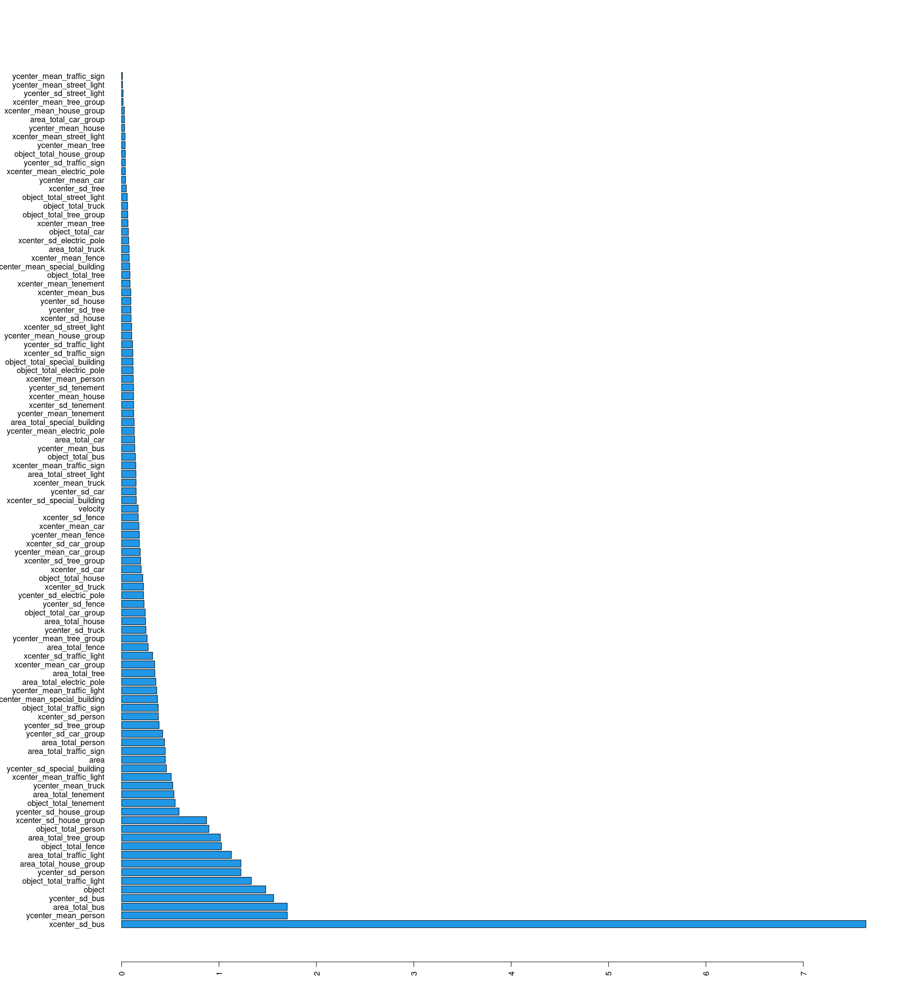

In [159]:
options(repr.plot.width=19, repr.plot.height=21)

par(mar=c(4,12,4,4))

barplot(importance, horiz = TRUE, las=2, col = 4)

## Model Diagnostic

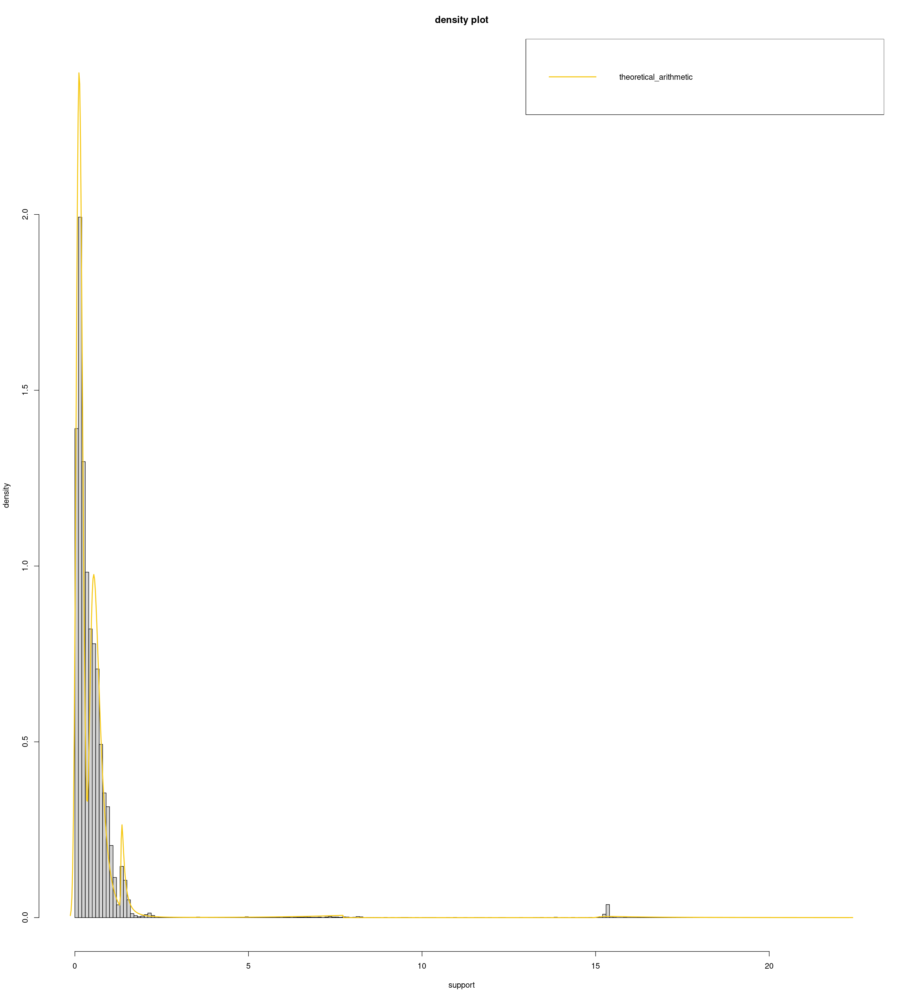

In [160]:
plot_fit_non_stationary_evd_mixture_model(
  evd_mixture_model_object = ns_evd_mixture_model_object,
  data_index = 0,
  nclass = 200,
  display_all = FALSE,
  xlab = "support",
  ylab = "density",
  main = "density plot",
  legend_position = "topright")

## Model quantile

In [161]:
n <- length(x)

n

[1] 22846

In [162]:
alpha <- n^(-1)

alpha

[1] 4.377133853e-05

In [163]:
calculate_quantile <- function(index, predictors){
    cluster_models <- ns_evd_mixture_model_object$cluster_models
    cluster_attractors_weights <- ns_evd_mixture_model_object$cluster_attractors_weights
    
    data <- dplyr::slice(predictors, index)
    cluster_models_parameters <- get_several_ns_gev_model_parameters(several_ns_gev_models = cluster_models, 
                                                                     data = data) 

    cluster_models_parameters <- do.call(what = rbind, cluster_models_parameters)
  
    shapes <- cluster_models_parameters$shape
    scales <- cluster_models_parameters$scale
    locations <- cluster_models_parameters$location

    quantile <- calculate_gev_mixture_model_inverse_cdf(p = 1 - alpha,
                                                        locations = locations,
                                                        scales = scales,
                                                        shapes = shapes,
                                                        weights = cluster_attractors_weights,
                                                        kind = c("geometric", "arithmetic", "harmonic")[2],
                                                        iterations = 20)
    quantile
                                                                 
}

In [164]:
# defaultW <- getOption("warn") 
# options(warn = -1)


# predictors <- selected_data_covariates


# cluster_models <- ns_evd_mixture_model_object$cluster_models

# cluster_attractors_weights <- ns_evd_mixture_model_object$cluster_attractors_weights

# quantile_object <- lapply(1:nrow(predictors), function(index){
  
#   data <- dplyr::slice(predictors, index)
  
#   cluster_models_parameters <- get_several_ns_gev_model_parameters(several_ns_gev_models = cluster_models, 
#                                                                    data = data) 
  
#   cluster_models_parameters <- do.call(what = rbind, cluster_models_parameters)
  
#   shapes <- cluster_models_parameters$shape
#   scales <- cluster_models_parameters$scale
#   locations <- cluster_models_parameters$location
  
#   quantile <- calculate_gev_mixture_model_inverse_cdf(p = 1 - alpha,
#                                                       locations = locations,
#                                                       scales = scales,
#                                                       shapes = shapes,
#                                                       weights = cluster_attractors_weights,
#                                                       kind = c("geometric", "arithmetic", "harmonic")[2],
#                                                       iterations = 20)
#   quantile
# })


# options(warn = defaultW)

In [165]:
defaultW <- getOption("warn") 
options(warn = -1) 


plan(multisession, workers = 16)

quantile_object <- future_lapply(1:nrow(selected_data_covariates), FUN = calculate_quantile, selected_data_covariates)


options(warn = defaultW)

In [166]:
quantile_data <- data.frame("actual_response" = x,
                            "quantile_response" = unlist(quantile_object))


DT::datatable(quantile_data)

HTML widgets cannot be represented in plain text (need html)

In [167]:
df <- quantile_data |> mutate(diff = quantile_response - actual_response)

In [168]:
v <- which(df$diff > 0)
v

[1]     1     2     3     4     5     6     7     8     9    10    11    12
   [13]    13    14    15    16    17    18    19    20    21    22    23    24
   [25]    25    26    27    28    29    30    31    32    33    34    35    36
   [37]    37    38    39    40    41    42    43    44    45    46    47    48
   [49]    49    50    51    52    53    54    55    56    57    58    59    60
   [61]    61    62    63    64    65    66    67    68    69    70    71    72
   [73]    73    74    75    76    77    78    79    80    81    82    83    84
   [85]    85    86    87    88    89    90    91    92    93    94    95    96
   [97]    97    98    99   100   101   102   103   104   105   106   107   108
  [109]   109   110   111   112   113   114   115   116   117   118   119   120
  [121]   121   122   123   124   125   126   127   128   129   130   131   132
  [133]   133   134   135   136   137   138   139   140   141   142   143   144
  [145]   145   146   147   148   149   150   151   152   153   154   155   156
  [157]   157   158   159   160   161   162   163   164   165   166   167   168
  [169]   169   170   171   172   173   174   175   176   177   178   179   180
  [181]   181   182   183   184   185   186   187   188   189   190   191   192
  [193]   193   194   195   196   197   198   199   200   201   202   203   204
  [205]   205   206   207   208   209   210   211   212   213   214   215   216
  [217]   217   218   219   220   221   222   223   224   225   226   227   228
  [229]   229   230   231   232   233   234   235   236   237   238   239   240
  [241]   241   242   243   244   245   246   247   248   249   250   251   252
  [253]   253   254   255   256   257   258   259   260   261   262   263   264
  [265]   265   266   267   268   269   270   271   272   273   274   275   276
  [277]   277   278   279   280   281   282   283   284   285   286   287   288
  [289]   289   290   291   292   293   294   295   296   297   298   299   300
  [301]   301   302   303   304   305   306   307   308   309   310   311   312
  [313]   313   314   315   316   317   318   319   320   321   322   323   324
  [325]   325   326   327   328   329   330   331   332   333   334   335   336
  [337]   337   338   339   340   341   342   343   344   345   346   347   348
  [349]   349   350   351   352   353   354   355   356   357   358   359   360
  [361]   361   362   363   364   365   366   367   368   369   370   371   372
  [373]   373   374   375   376   377   378   379   380   381   382   383   384
  [385]   385   386   387   388   389   390   391   392   393   394   395   396
  [397]   397   398   399   400   401   402   403   404   405   406   407   408
  [409]   409   410   411   412   413   414   415   416   417   418   419   420
  [421]   421   422   423   424   425   426   427   428   429   430   431   432
  [433]   433   434   435   436   437   438   439   440   441   442   443   444
  [445]   445   446   447   448   449   450   451   452   453   454   455   456
  [457]   457   458   459   460   461   462   463   464   465   466   467   468
  [469]   469   470   471   472   473   474   475   476   477   478   479   480
  [481]   481   482   483   484   485   486   487   488   489   490   491   492
  [493]   493   494   495   496   497   498   499   500   501   502   503   504
  [505]   505   506   507   508   509   510   511   512   513   514   515   516
  [517]   517   518   519   520   521   522   523   524   525   526   527   528
  [529]   529   530   531   532   533   534   535   536   537   538   539   540
  [541]   541   542   543   544   545   546   547   548   549   550   551   552
  [553]   553   554   555   556   557   558   559   560   561   562   563   564
  [565]   565   566   567   568   569   570   571   572   573   574   575   576
  [577]   577   578   579   580   581   582   583   584   585   586   587   588
  [589]   589   590   591   592   593   594   595   596   597   598   599   600
  [6

In [169]:
length(v)

[1] 22846

In [170]:
describe(quantile_data)

quantile_data 

 2  Variables      22846  Observations
--------------------------------------------------------------------------------
actual_response 
       n  missing distinct     Info     Mean      Gmd      .05      .10 
   22846        0    22580        1   0.5857   0.6824  0.04819  0.08723 
     .25      .50      .75      .90      .95 
 0.14571  0.32552  0.63158  0.94870  1.31011 

lowest : 8.5354e-05  8.76884e-05 0.000136104 0.000184512 0.00026877 
highest: 21.7967     21.895      22.055      22.0902     22.2734    
--------------------------------------------------------------------------------
quantile_response 
       n  missing distinct     Info     Mean      Gmd      .05      .10 
   22846        0    22846        1     1697    4.254     1690     1693 
     .25      .50      .75      .90      .95 
    1695     1697     1699     1701     1703 

lowest : 1670.2  1671.33 1672.45 1672.53 1673   
highest: 1719.77 1720.32 1721.26 1723.49 1726.4 
---------------------------------

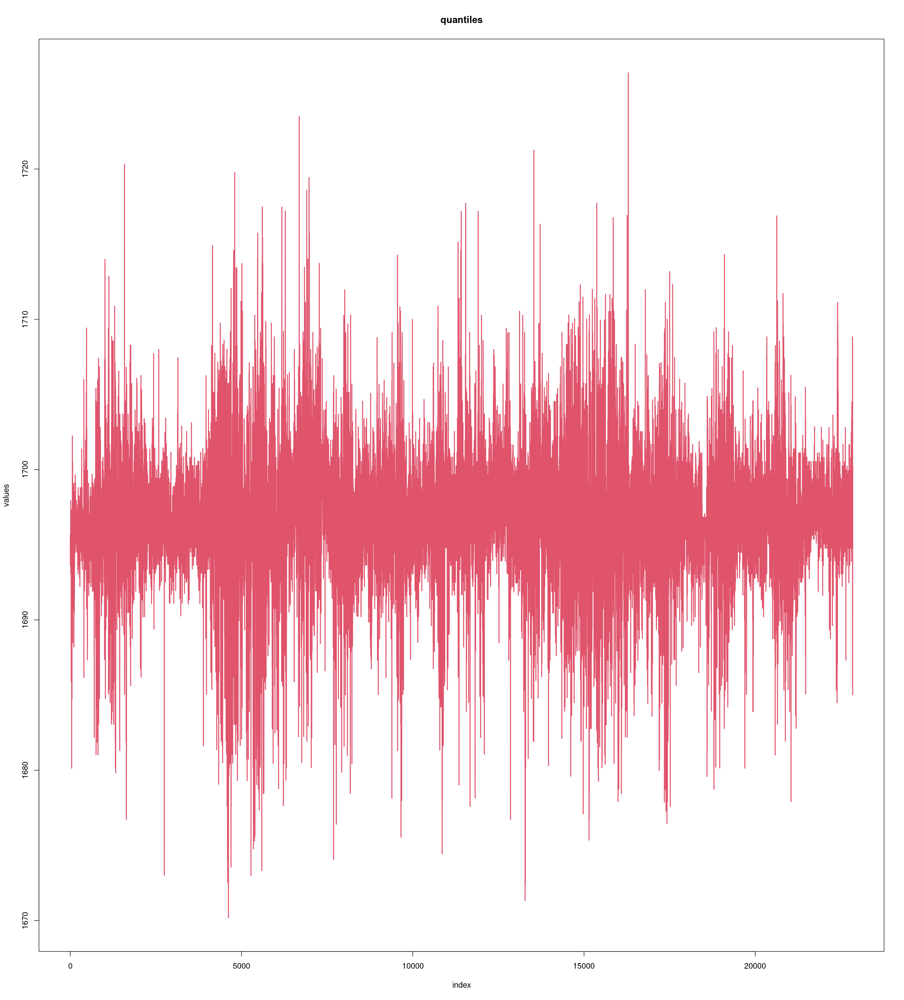

In [171]:
plot(quantile_data$quantile_response, 
     type = "l", 
     lwd = 2, 
     col = 2,
     ylab = "values", 
     xlab = "index",
    main = "quantiles")

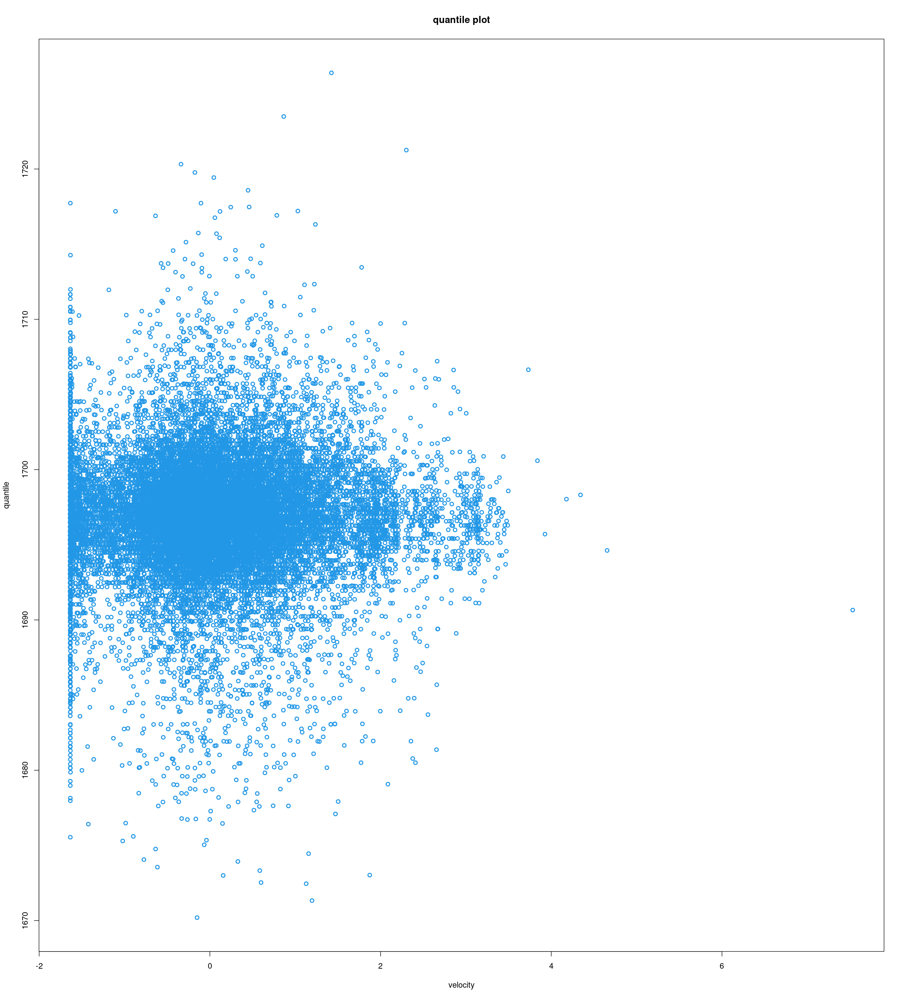

In [172]:
selected_var <- selected_vars[1]

plot(x = selected_data_covariates[, selected_var],
     y = quantile_data$quantile_response, 
     type = "p", 
     lwd = 2, 
     col = 4,
     ylab = "quantile", 
     xlab = paste(selected_var),
     main = "quantile plot")

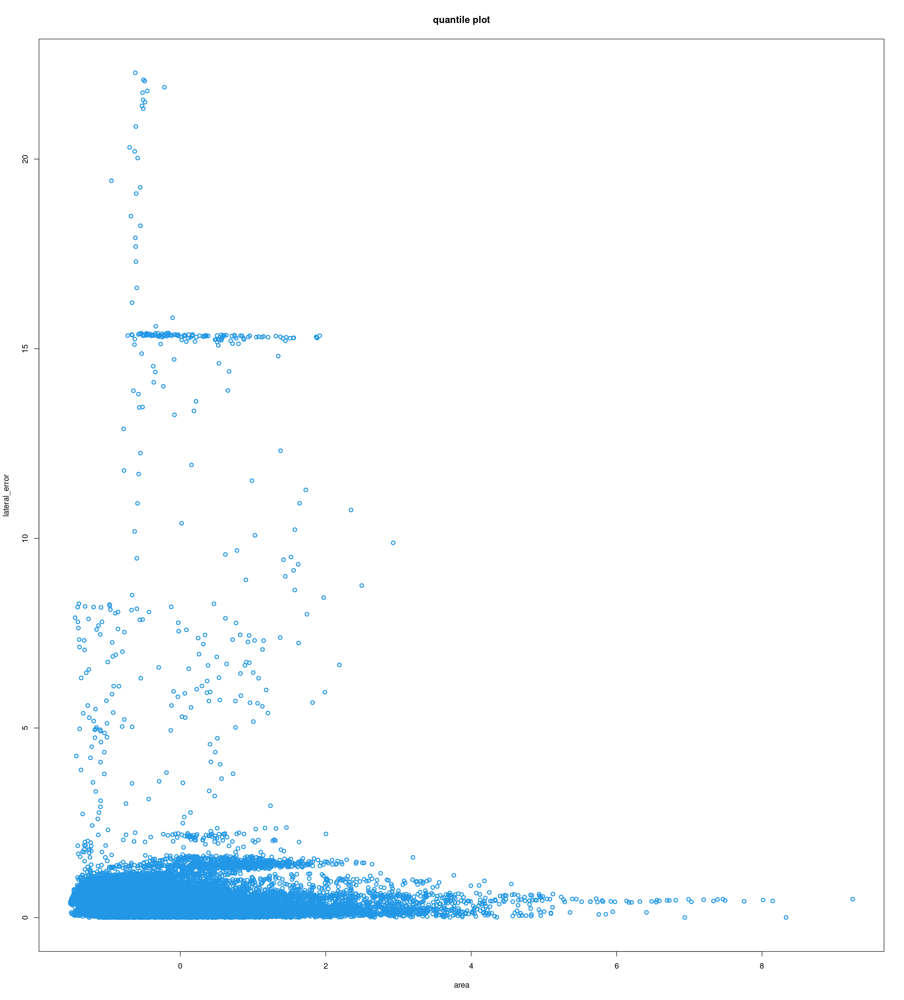

In [173]:
selected_var <- selected_vars[3]

plot(x = selected_data_covariates[, selected_var],
     y = x, 
     type = "p", 
     lwd = 2, 
     col = 4,
     ylab = paste(response_var), 
     xlab = paste(selected_var),
    main = "quantile plot")

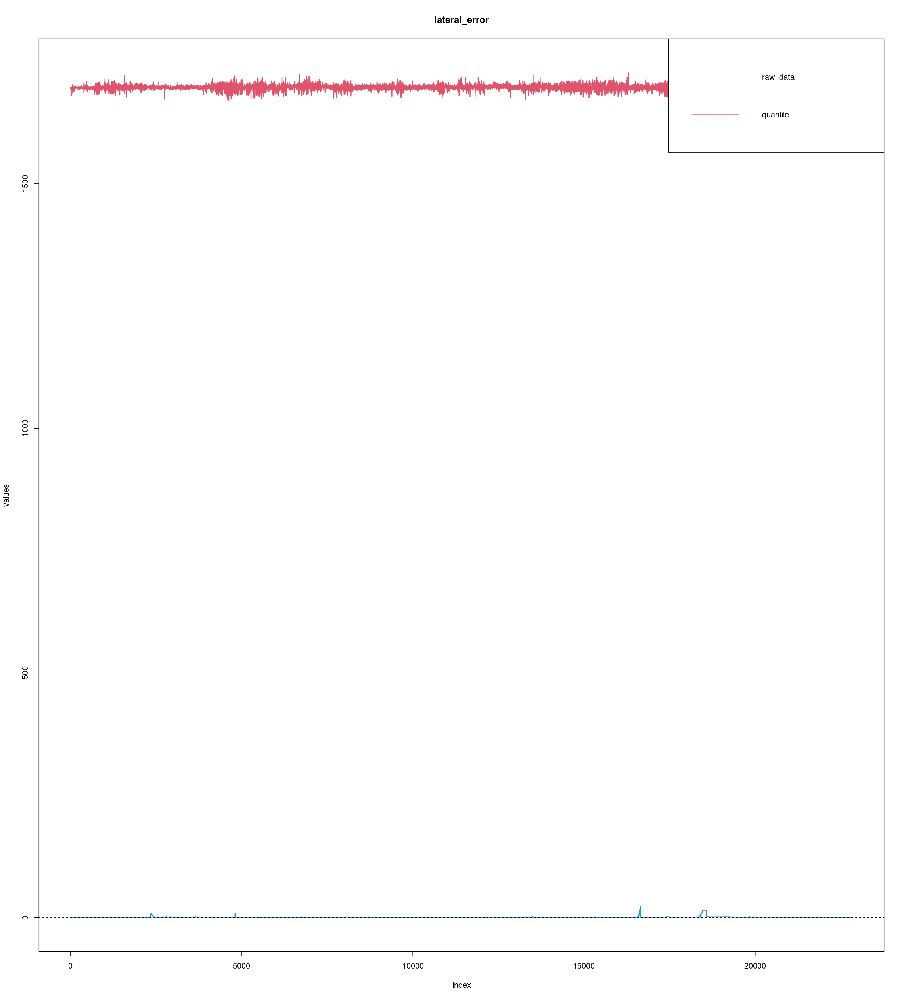

In [174]:
plot(quantile_data$actual_response, 
     type = "l", 
     lwd = 2, 
     col = 4,
     ylim = c(0, max(quantile_data)),
     ylab = "values", 
     xlab = "index",
    main = paste(response_var))

abline(h = 0, lty = "dotted", col = 1, lwd = 2)
lines(quantile_data$quantile_response, lty = 1, col = 2, lwd = 2)

legend("topright", legend = c("raw_data", "quantile"), col = c(4, 2), lty = 1:1, cex = 1)

## Model exploitation

In [175]:
experimentations <- c("experimentation_01", "experimentation_02", "experimentation_03", "experimentation_04")

response_vars <- c("lateral_error", "longitudinal_error")

In [176]:
new_experimentation <- experimentations[2]

response_var <- response_vars[1]

In [177]:
# extract the new selected data
if (new_experimentation == "experimentation_01"){
    new_data <- experimentation_01_merged_data
} else if (new_experimentation == "experimentation_02"){
    new_data <- experimentation_02_merged_data
} else if (new_experimentation == "experimentation_03"){
    new_data <- experimentation_03_merged_data
} else if (new_experimentation == "experimentation_04"){
    new_data <- experimentation_04_merged_data
} else {
    stop("Sorry, incorrect entry for the argument 'new_experimentation'")
}

In [178]:
new_data_response <- abs(new_data[, response_var])

In [179]:
unscaled_new_data_covariates <- new_data |> select(all_of(names(unscaled_data_covariates)))

In [180]:
unscaled_data_covariates_mean_list <- as.list(apply(unscaled_data_covariates, 2, mean, na.rm = TRUE))

In [181]:
unscaled_new_data_covariates <- unscaled_new_data_covariates %>% mutate_if(is.integer, as.double)
unscaled_new_data_covariates <- unscaled_new_data_covariates %>% replace_na(replace = unscaled_data_covariates_mean_list)

In [182]:
# DT::datatable(unscaled_new_data_covariates)

In [183]:
scaled_new_data_covariates <- get_standard_scaled_data(data = unscaled_data_covariates, newdata = unscaled_new_data_covariates)

In [184]:
# DT::datatable(scaled_new_data_covariates)

In [185]:

n <- length(x)

n

[1] 22846

In [186]:
alpha <- n^(-1)

alpha

[1] 4.377133853e-05

In [187]:
# defaultW <- getOption("warn") 
# options(warn = -1)


# predictors <- scaled_new_data_covariates


# cluster_models <- ns_evd_mixture_model_object$cluster_models

# cluster_attractors_weights <- ns_evd_mixture_model_object$cluster_attractors_weights

# quantile_object <- lapply(1:nrow(predictors), function(index){
  
#   data <- dplyr::slice(predictors, index)
  
#   cluster_models_parameters <- get_several_ns_gev_model_parameters(several_ns_gev_models = cluster_models, 
#                                                                    data = data) 
  
#   cluster_models_parameters <- do.call(what = rbind, cluster_models_parameters)
  
#   shapes <- cluster_models_parameters$shape
#   scales <- cluster_models_parameters$scale
#   locations <- cluster_models_parameters$location
  
#   quantile <- calculate_gev_mixture_model_inverse_cdf(p = 1 - alpha,
#                                                       locations = locations,
#                                                       scales = scales,
#                                                       shapes = shapes,
#                                                       weights = cluster_attractors_weights,
#                                                       kind = c("geometric", "arithmetic", "harmonic")[2],
#                                                       iterations = 20)
#   quantile
# })


# options(warn = defaultW)

In [188]:
defaultW <- getOption("warn") 
options(warn = -1) 


plan(multisession, workers = 16)

new_quantile_object <- future_lapply(1:nrow(scaled_new_data_covariates), FUN = calculate_quantile, scaled_new_data_covariates)


options(warn = defaultW)

In [189]:
new_quantile_data <- data.frame("new_actual_response" = new_data_response,
                                "new_quantile_response" = unlist(new_quantile_object))


DT::datatable(new_quantile_data)

HTML widgets cannot be represented in plain text (need html)

In [190]:
describe(new_quantile_data)

new_quantile_data 

 2  Variables      35082  Observations
--------------------------------------------------------------------------------
new_actual_response 
       n  missing distinct     Info     Mean      Gmd      .05      .10 
   35082        0    34271        1   0.3122    0.306  0.01465  0.03139 
     .25      .50      .75      .90      .95 
 0.08809  0.23596  0.42176  0.71186  0.91196 

lowest : 2.36198e-05 3.23628e-05 3.71011e-05 4.66782e-05 5.11008e-05
highest: 6.38348     6.39178     6.39297     6.40818     6.40907    
--------------------------------------------------------------------------------
new_quantile_response 
       n  missing distinct     Info     Mean      Gmd      .05      .10 
   35082        0    35082        1     1697    2.684     1693     1694 
     .25      .50      .75      .90      .95 
    1695     1697     1698     1700     1701 

lowest : 1681.59 1682.04 1682.82 1683.01 1683.03
highest: 1707.68 1707.72 1708.01 1709.71 1710.33
---------------------

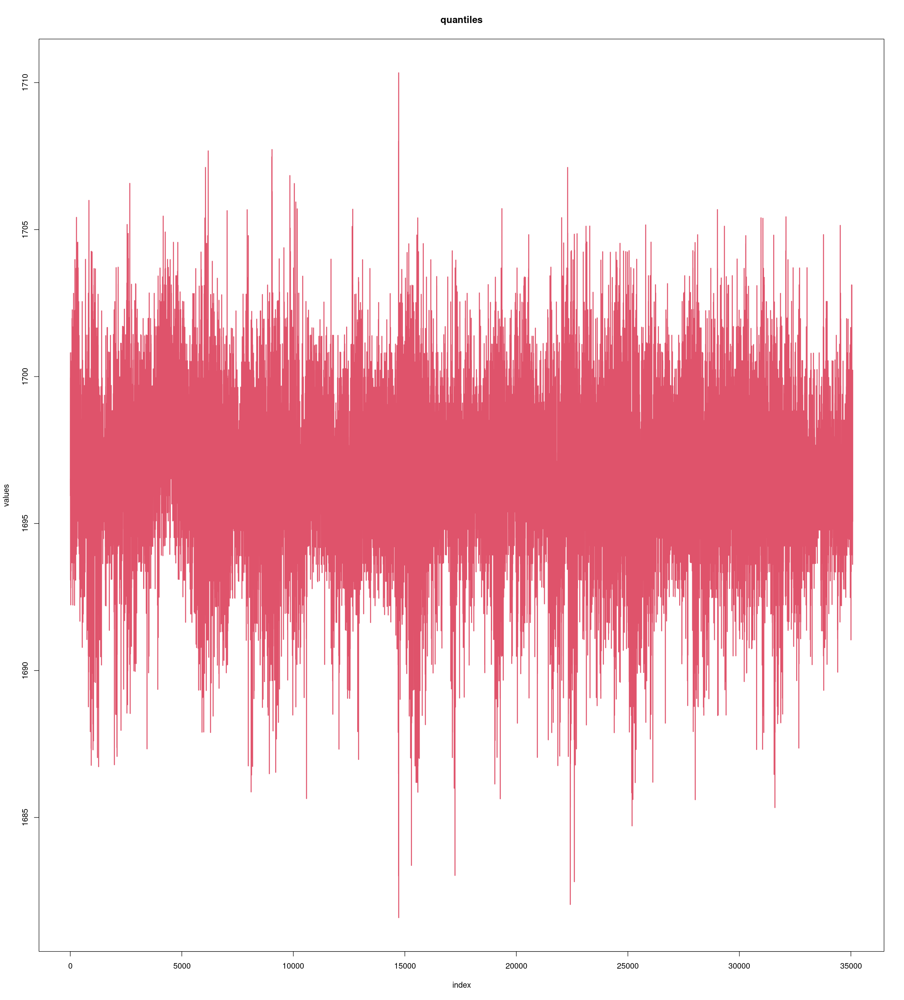

In [191]:
plot(new_quantile_data$new_quantile_response, 
     type = "l", 
     lwd = 2, 
     col = 2,
     ylab = "values", 
     xlab = "index",
    main = "quantiles")

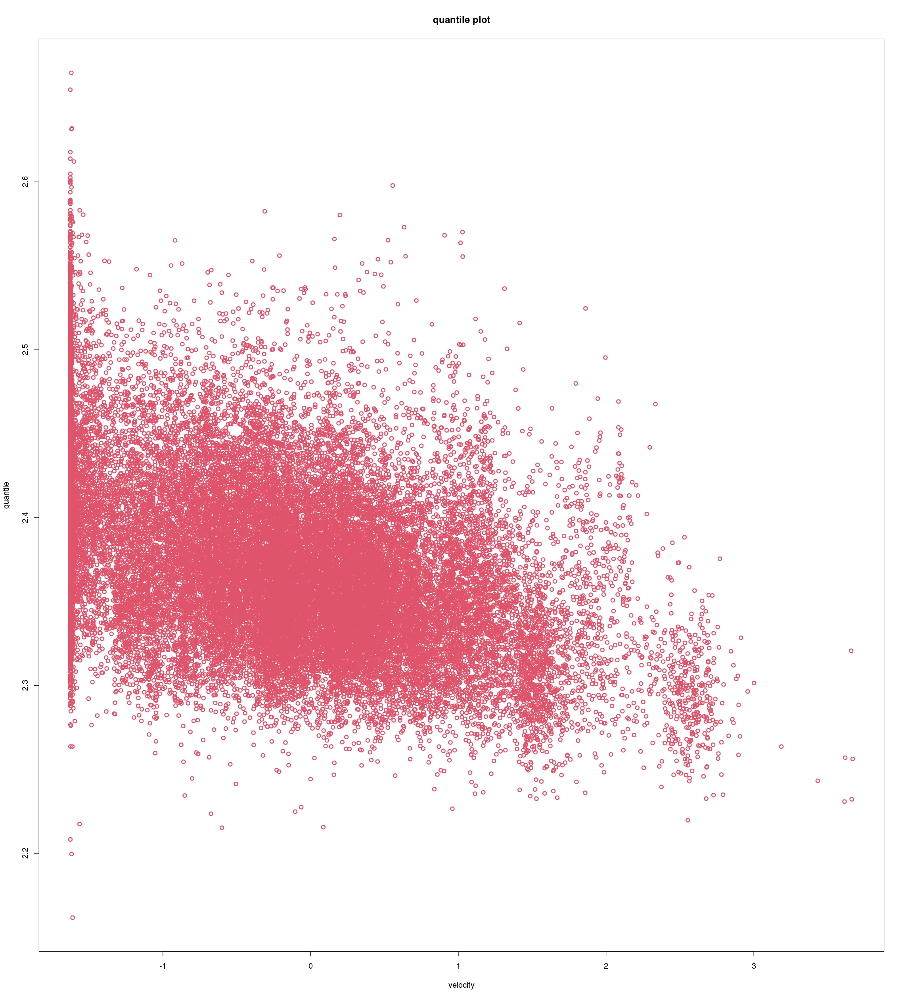

In [302]:
selected_var <- selected_vars[1]

plot(x = scaled_new_data_covariates[, selected_var],
     y = new_quantile_data$new_quantile_response, 
     type = "p", 
     lwd = 2, 
     col = 2,
     ylab = "quantile", 
     xlab = paste(selected_var),
     main = "quantile plot")

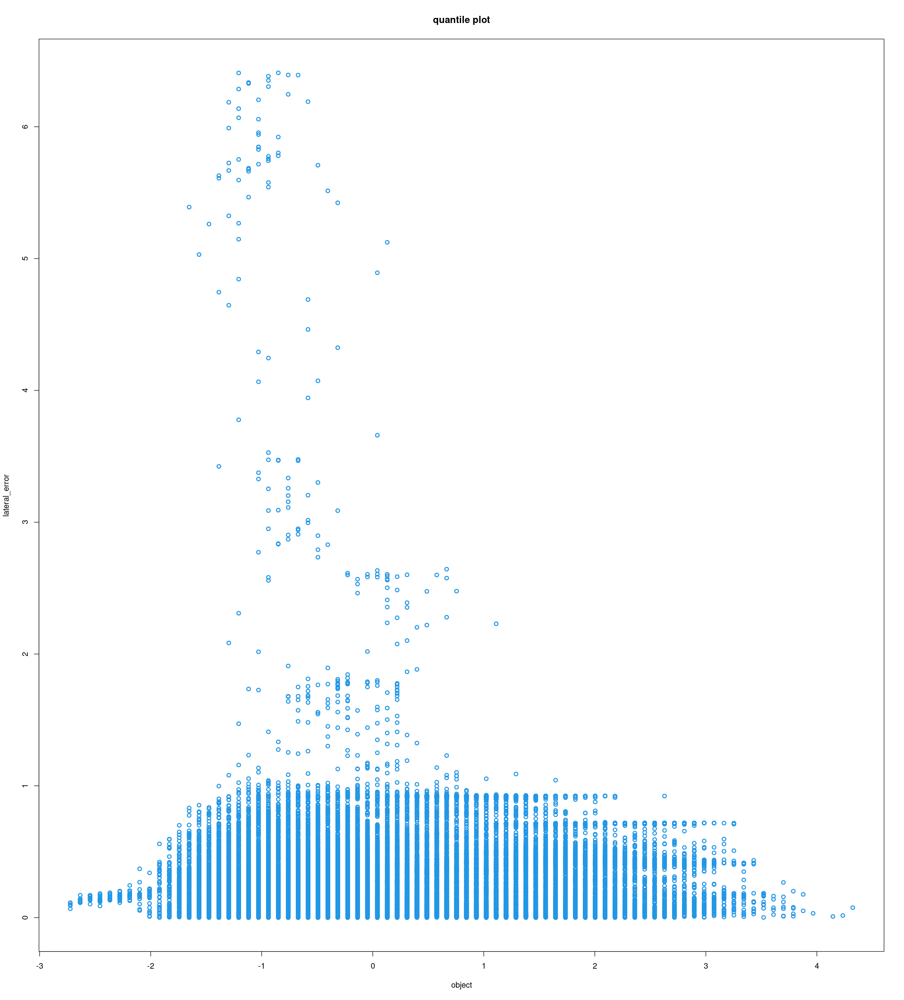

In [303]:
selected_var <- selected_vars[2]

plot(x = scaled_new_data_covariates[, selected_var],
     y = new_data_response, 
     type = "p", 
     lwd = 2, 
     col = 4,
     ylab = paste(response_var), 
     xlab = paste(selected_var),
     main = "quantile plot")

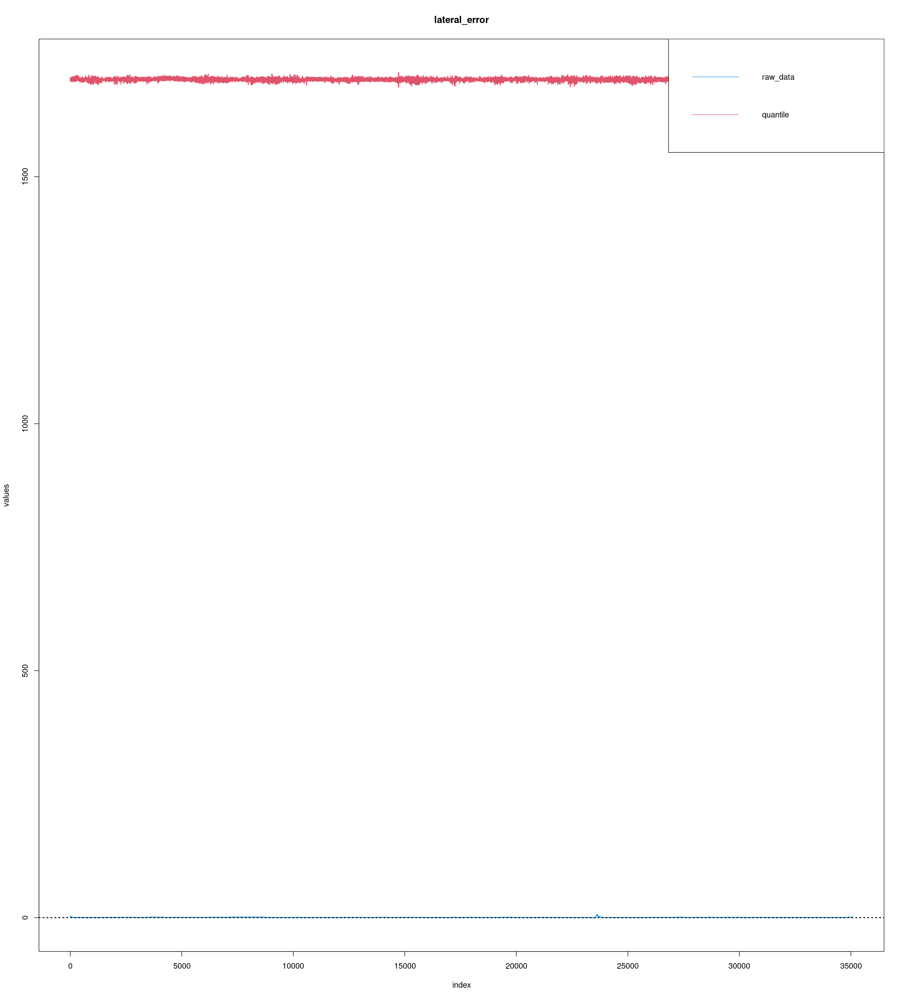

In [192]:
plot(new_quantile_data$new_actual_response, 
     type = "l", 
     lwd = 2, 
     col = 4,
     ylim = c(0, max(new_quantile_data)),
     ylab = "values", 
     xlab = "index",
    main = paste(response_var))

abline(h = 0, lty = "dotted", col = 1, lwd = 2)
lines(new_quantile_data$new_quantile_response, lty = 1, col = 2, lwd = 2)

legend("topright", legend = c("raw_data", "quantile"), col = c(4, 2), lty = 1:1, cex = 1)

In [202]:
new_data_processed_object <- transform_data(
  data = new_data, 
  response_var = response_var,
  response_abs = response_abs,
  scale_predictors = scale_predictors,
  coefficient_iqr = coefficient_iqr, 
  iterate = iterate,
  remove_outliers = remove_outliers,
  method = method)

In [206]:
new_actual_response_without_outliers <- new_data_processed_object$response

In [207]:
length(new_quantile_data$new_quantile_response)

[1] 35082

In [209]:
new_quantile_data_without_outliers <- data.frame("new_actual_response" = new_actual_response_without_outliers,
                                                 "new_quantile_response" = new_quantile_data$new_quantile_response)


DT::datatable(new_quantile_data_without_outliers)

HTML widgets cannot be represented in plain text (need html)

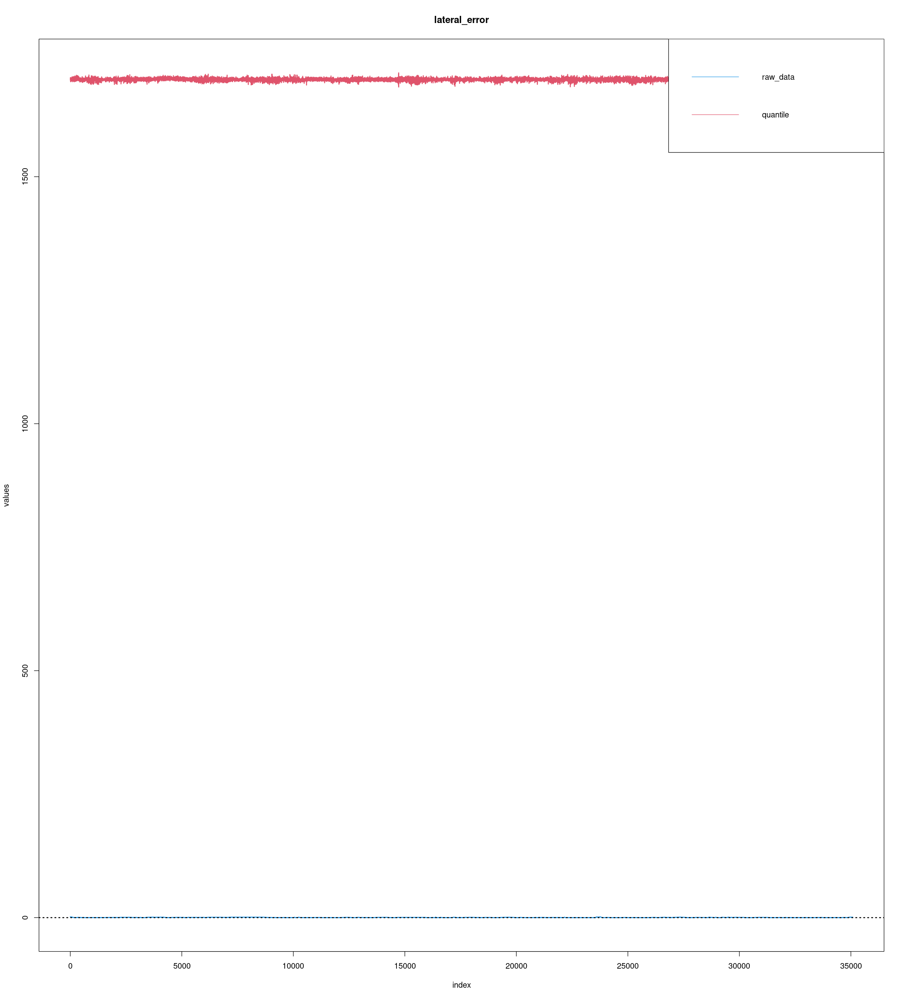

In [210]:
plot(new_actual_response_without_outliers, 
     type = "l", 
     lwd = 2, 
     col = 4,
     ylim = c(0, max(new_quantile_data)),
     ylab = "values", 
     xlab = "index",
    main = paste(response_var))

abline(h = 0, lty = "dotted", col = 1, lwd = 2)
lines(new_quantile_data$new_quantile_response, lty = 1, col = 2, lwd = 2)

legend("topright", legend = c("raw_data", "quantile"), col = c(4, 2), lty = 1:1, cex = 1)